# Raw VS smoothed in situ drifters focalised one on drifter type
- global distribution figure
- global rms figure

In [1]:
import os
from glob import glob

import numpy as np
import pandas as pd
import xarray as xr

%matplotlib inline
import matplotlib.pyplot as plt
import hvplot.xarray  # noqa
import holoviews as hv
#
import pynsitu as pyn
from pynsitu.maps import crs
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.geodesic import Geodesic

from lib import raw_dir, root_dir, smoothed_dir, KEYS, list_type, open_L1_dataset, open_L2_dataset, images_dir

import datetime
from scipy.stats import norm

/Users/mdemol/opt/anaconda3/envs/mdenv/lib/python3.9/site-packages/pyTMD/tools.py:55: UserWarning: ipyleaflet not available
  warnings.warn("ipyleaflet not available")
/Users/mdemol/opt/anaconda3/envs/mdenv/lib/python3.9/site-packages/pyTMD/tools.py:56: UserWarning: Some functions will throw an exception if called
  warnings.warn("Some functions will throw an exception if called")


In [2]:
version = 'v0'
def set_usual_attrs(ds, attrs_ds):
    ds.attrs.update(attrs_ds)
    ds.id.attrs.update(longname="id", description="drifter id")
    ds.time.attrs.update(longname="Time")
    ds.lat.attrs.update(longname="Latitude", units="°")
    ds.lon.attrs.update(longname="Longitude", units="°")
    ds.platform.attrs.update(
        longname="Platform", description="second way of identification"
    )
    ds.x.attrs.update(
        longname="Zonal position",
        description="Zonal position in the local frame",
        units="m",
    )
    ds.y.attrs.update(
        longname="Meridional position",
        description="Meridional position in the local frame",
        units="m",
    )
    ds.X.attrs.update(longname="Position norm", units="m")
    ds.u.attrs.update(
        longname="Zonal velocity",
        description="Zonal velocity computed via centered differentiation from x",
        units="m/s",
    )
    ds.v.attrs.update(
        longname="Meridional velocity",
        description="Meridional velocity computed via centered differentiation from y",
        units="m/s",
    )
    ds.U.attrs.update(longname="Velocity norm", units="m/s")
    ds.ax.attrs.update(
        longname="Zonal acceleration",
        description="Zonal acceleration computed via centered differentiation from x",
        units=r"$m.s^2$",
    )
    ds.ay.attrs.update(
        longname="Meridional acceleration",
        description="Meridional acceleration computed via centered differentiation from y",
        units=r"$m.s^2$",
    )
    ds.Axy.attrs.update(longname="Acceleration norm", description=r"\sqrt(ax^2+ay^2)", units=r"$m.s^2$")
    ds.au.attrs.update(
        longname="Zonal acceleration",
        description="Zonal acceleration computed via centered differentiation from u",
        units=r"$m.s^2$",
    )
    ds.av.attrs.update(
        longname="Meridional acceleration",
        description="Meridional acceleration computed via centered differentiation from v",
        units=r"$m.s^2$",
    )
    ds.Auv.attrs.update(longname="Acceleration norm", description=r"\sqrt(au^2+av^2)", units=r"$m.s^2$")
    
    ds.lonc.attrs.update(
        longname="Longitude of reference",
        description="Longitude used as reference for the local frame projection",
    )
    ds.latc.attrs.update(
        longname="Latitude of reference",
        description="Longitude used as reference for the local frame projection",
    )
    ds.gap_mask.attrs.update(
        longname="Gap mask",
        description="Flags for gaps . CAUTION : values in these gaps (flagged by gap_mask=1) were linearly interpolated to have a regular sampling, and should be masked"
    )
    ds.gaps.attrs.update(
        longname="Gaps",
        description="distance to the nearest raw time",
    )

def apply_optimize_smoothing(path_file_L1_csv, t_target, method, version=version, param=None, maxgap=3*3600):
    # LOAD AND CHECK
    df = pd.read_csv(path_file_L1_csv, parse_dates=["time"], dtype={"id": str}).set_index("id")[['time', 'lat', 'lon',
       'platform', 'x', 'y', 'dt', 'velocity_east', 'velocity_north',
       'velocity', 'acceleration_east', 'acceleration_north', 'acceleration',
       'lonc', 'latc']]
    ds_L1 = xr.open_dataset(path_file_L1_csv.replace('.csv', '.nc'))
    ids = sorted(list(df.index.unique()))

    # OPTIMIZED PARAMETERS
    if not param :
        if method=='lowess' :
            from pynsitu.drifters import parameters_lowess
            param = parameters_lowess.copy()
            if t_target =='1h' or t_target=='1H':
                param['T_low_pass']=2
            print(param)
        if method=='variational' :
            from pynsitu.drifters import parameters_var
            param = parameters_var.copy()
            print(param)
    #3h
    
    #APPLY METHOD
    dfs = pyn.drifters.smooth_all(
    df,
    method,
    t_target,
    parameters=param,
    import_columns=["id", 'platform'],
    maxgap =maxgap,
    spectral_diff=False,
    geo=True,
    )
    
    dss = dfs.reset_index().set_index(["id", "time"]).to_xarray()
    dss['platform']=dfs.set_index('id').platform.groupby('id').first().to_xarray()
    dss['lonc'] = dss['lonc'].mean('time')
    dss['latc'] = dss['latc'].mean('time')
    
    #ATTRS
    attrs_ds = ds_L1.attrs
    attrs_ds['description']=f"L2 product - applied smoothing method on L1-datasets. All gaps of more than {round(maxgap/3600,2)} hours are linearly interpolated to obtain a regularly sampled product and flagged with a ‘gap_mask' = 1 value (‘gap_mask' = 0 otherwise))."
    attrs_ds["generation_date"]=str(datetime.datetime.now())
    if method=='lowess' : 
        attrs_ds['smoothing_method_description'] = f"LOWESS method (polynomial=linear, {param['iteration']} iterations, Elipot et al.2016) + low pass filter with cutoff frequency of {param['cutoff_low_pass']} cpd and computed on {param['T_low_pass']} days, see https://github.com/apatlpo/pynsitu/tree/9eea25a9cb1ea112f9882fc3252de21e4290a47d/pynsitu"
        attrs_ds['smoothing_method_param_dict'] = f'{param}'
    if method=='variational' : 
        attrs_ds['smoothing_method_description'] = 'Variational method, see https://github.com/apatlpo/pynsitu/tree/9eea25a9cb1ea112f9882fc3252de21e4290a47d/pynsitu'
        attrs_ds['smoothing_method_param_dict'] = f'{param}'
    attrs_ds['interpolation_sampling'] = t_target
    attrs_ds['nominal_raw_sampling'] = path_file_L1_csv.split('_')[-1].replace('.csv','')
    attrs_ds['version'] = version
    
    set_usual_attrs(dss, attrs_ds)
    
    def path_(path_file_L1_csv):
        l = path_file_L1_csv.split('_')
        return ('_'.join(l[:-3]+[l[-1].replace('.csv','')])).replace('raw',f'variational_pb').replace('L1_', 'L2_')+f'_{method}_{t_target}_{version}.nc'


    #path = path_(path_file_L1_csv)
    #dss.to_netcdf(path)
    #print(path)
    return dss

In [3]:
def spectrum__(ds, nperseg="10D", detrend='linear', complex=('u','v')):
    spec_id = []
    for i in range(ds.dims['id']):
        try : spec_id.append(ds.isel(id=i).dropna('time').ts.spectrum(unit="1D", nperseg=nperseg, detrend=detrend, complex=complex))
        except : 
            if ds.isel(id=i).dropna('time').time.max()-ds.isel(id=i).dropna('time').time.min()<=pd.Timedelta(nperseg): 
                print(f'{i} too short')
                continue
            else : assert False, i
    return xr.concat(spec_id,dim='id')

def spectrum_var(ds, nperseg="10D", detrend='linear',):
    S = []
    for var in [('x', 'y'),('u', 'v'), ('ax', 'ay')]:
        S.append(spectrum__(ds, nperseg="10D", detrend=detrend, complex=var))
    return xr.merge(S)

________
# Compute variational

In [17]:
ds2v = open_L2_dataset(smoothed_dir,'carthe_uwa_5min', 'variational', '30min', mask=False)
ds2s = open_L2_dataset(smoothed_dir,'carthe_uwa_5min', 'lowess', '30min', mask=False)
path_L1 = '/Users/mdemol/DATA_DRIFTERS/drifters/raw/L1_carthe_uwa_20231006_094155_5min.csv'

/Users/mdemol/DATA_DRIFTERS/drifters/smoothed/L2_carthe_uwa_5min_variational_30min_v0.nc
/Users/mdemol/DATA_DRIFTERS/drifters/smoothed/L2_carthe_uwa_5min_lowess_30min_v0.nc


In [9]:
ds1 = open_L1_dataset(raw_dir,'carthe_uwa_5min')

/Users/mdemol/DATA_DRIFTERS/drifters/raw/L1_carthe_uwa_20231006_094155_5min.nc


________
# Test chunk

In [20]:
df_L1 =pd.read_csv(path_L1, parse_dates=["time"], dtype={"id": str})

param_var = dict(
    acc_cut=1,
    position_error=60,
    acceleration_amplitude=5e-6,
    acceleration_T=0.05 * 86400,
    time_chunk=2,
    acc_cut_key=("acceleration_east", "acceleration_north", "acceleration"),
)
    
ds = apply_optimize_smoothing(path_L1, t_target='30min', method='variational', version=version, param=param_var)
param_var['acceleration_amplitude']=5e-6

Divided into 1 segments
Chunking dataframe into 2 days chunks
['2023-06-03 02:00:00', '2023-06-04 12:00:00', '2023-06-05 21:30:00', '2023-06-07 07:00:00', '2023-06-08 16:30:00', '2023-06-10 02:00:00', '2023-06-11 12:00:00', '2023-06-12 21:30:00', '2023-06-14 07:00:00', '2023-06-15 16:30:00', '2023-06-17 02:00:00', '2023-06-18 12:00:00', '2023-06-19 21:30:00', '2023-06-21 07:00:00', '2023-06-22 16:30:00', '2023-06-24 02:00:00', '2023-06-25 12:00:00', '2023-06-26 21:30:00', '2023-06-28 07:00:00', '2023-06-29 16:30:00', '2023-07-01 02:00:00', '2023-07-02 12:00:00', '2023-07-03 21:30:00', '2023-07-05 07:00:00', '2023-07-06 16:30:00', '2023-07-08 02:00:00', '2023-07-09 12:00:00', '2023-07-10 21:30:00', '2023-07-12 07:00:00', '2023-07-13 16:30:00', '2023-07-15 02:00:00', '2023-07-16 12:00:00', '2023-07-17 21:30:00', '2023-07-19 07:00:00', '2023-07-20 16:30:00', '2023-07-22 02:00:00', '2023-07-23 12:00:00', '2023-07-24 21:30:00', '2023-07-26 07:00:00', '2023-07-27 16:30:00', '2023-07-29 02:00

In [ ]:
chunktime = ['2023-06-01 14:00:00', '2023-06-03 00:00:00', '2023-06-04 09:30:00', '2023-06-05 19:00:00', '2023-06-07 04:30:00', '2023-06-08 14:00:00', '2023-06-10 00:00:00', '2023-06-11 09:30:00', '2023-06-12 19:00:00', '2023-06-14 04:30:00', '2023-06-15 14:00:00', '2023-06-17 00:00:00', '2023-06-18 09:30:00', '2023-06-19 19:00:00', '2023-06-21 04:30:00', '2023-06-22 14:00:00', '2023-06-24 00:00:00', '2023-06-25 09:30:00', '2023-06-26 19:00:00', '2023-06-28 04:30:00', '2023-06-29 14:00:00', '2023-07-01 00:00:00', '2023-07-02 09:30:00', '2023-07-03 19:00:00', '2023-07-05 04:30:00', '2023-07-06 14:00:00', '2023-07-08 00:00:00', '2023-07-09 09:30:00', '2023-07-10 19:00:00', '2023-07-12 04:30:00', '2023-07-13 14:00:00', '2023-07-15 00:00:00', '2023-07-16 09:30:00', '2023-07-17 19:00:00', '2023-07-19 04:30:00', '2023-07-20 14:00:00', '2023-07-22 00:00:00', '2023-07-23 09:30:00', '2023-07-24 19:00:00', '2023-07-26 04:30:00', '2023-07-27 14:00:00', '2023-07-29 00:00:00', '2023-07-30 09:30:00', '2023-07-31 19:00:00', '2023-08-02 04:30:00', '2023-08-03 14:00:00', '2023-08-05 00:00:00', '2023-08-06 09:30:00', '2023-08-07 19:00:00', '2023-08-09 04:30:00', '2023-08-10 14:00:00', '2023-08-12 00:00:00', '2023-08-13 09:30:00', '2023-08-14 19:00:00', '2023-08-16 04:30:00', '2023-08-17 14:00:00', '2023-08-19 00:00:00', '2023-08-20 09:30:00', '2023-08-21 19:00:00', '2023-08-23 04:30:00', '2023-08-24 14:00:00', '2023-08-26 00:00:00', '2023-08-27 09:30:00', '2023-08-28 10:00:00', '2023-08-28 10:00:00']+['2023-09-16 09:00:00', '2023-09-17 09:00:00', '2023-09-17 09:00:00']

In [ ]:
chunk = pd.Series(data=0, index=pd.to_datetime(chunktime))

In [38]:
(ds1.u.sel(id='0-4698195').hvplot(kind='scatter', label='Raw')
 *ds.where(ds.gap_mask==0).u.sel(id='0-4698195').hvplot(kind='scatter', label = 'var')
 *ds.where(ds.gap_mask==1).u.sel(id='0-4698195').hvplot(kind='scatter', label = 'gap')
 *chunk.hvplot(kind='scatter', label = 'chunk')
 +ds1.x.sel(id='0-4698195').hvplot(kind='scatter', label='Raw')
 *ds.where(ds.gap_mask==0).sel(id='0-4698195').x.hvplot(kind='scatter', label = 'var')
 *ds.where(ds.gap_mask==1).x.sel(id='0-4698195').hvplot(kind='scatter', label = 'gap')
 *chunk.hvplot(kind='scatter', label='chunk')
)

:Layout
   .Overlay.I  :Overlay
      .Scatter.Raw   :Scatter   [time]   (u)
      .Scatter.Var   :Scatter   [time]   (u)
      .Scatter.Gap   :Scatter   [time]   (u)
      .Scatter.Chunk :Scatter   [index]   (0)
   .Overlay.II :Overlay
      .Scatter.Raw   :Scatter   [time]   (x)
      .Scatter.Var   :Scatter   [time]   (x)
      .Scatter.Gap   :Scatter   [time]   (x)
      .Scatter.Chunk :Scatter   [index]   (0)

________
# Test parametrs
## Pour dti =30min, change accelartion_amplitude
- take 5e-6

In [4]:
path_L1 = '/Users/mdemol/DATA_DRIFTERS/drifters/raw/L1_carthe_uwa_20231006_094155_5min.csv'
df_L1 =pd.read_csv(path_L1, parse_dates=["time"], dtype={"id": str})

param_var = dict(
    acc_cut=1,
    position_error=60,
    acceleration_amplitude=5e-6,
    acceleration_T=0.05 * 86400,
    time_chunk=2,
    acc_cut_key=("acceleration_east", "acceleration_north", "acceleration"),
)
    
ds2 = apply_optimize_smoothing(path_L1, t_target='30min', method='variational', version=version, param=param_var)

Divided into 1 segments
Chunking dataframe into 2 days chunks
Divided into 3 segments
Chunking dataframe into 2 days chunks
Divided into 2 segments
Chunking dataframe into 2 days chunks
Divided into 1 segments
Chunking dataframe into 2 days chunks
Divided into 3 segments
Chunking dataframe into 2 days chunks
Divided into 1 segments
Chunking dataframe into 2 days chunks
Divided into 1 segments
Chunking dataframe into 2 days chunks
Divided into 12 segments
Chunking dataframe into 2 days chunks
Divided into 1 segments
Chunking dataframe into 2 days chunks
Divided into 1 segments
Chunking dataframe into 2 days chunks


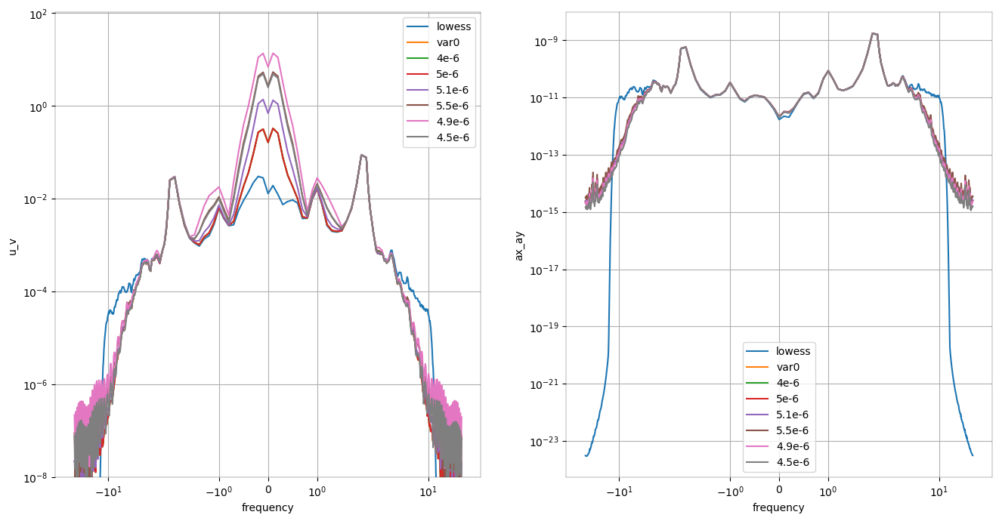

In [8]:
dss2s = spectrum_var(ds2s)
dss2v = spectrum_var(ds2v)
dss2 = spectrum_var(ds2)
dss3 = spectrum_var(ds3)
dss4 = spectrum_var(ds4)
dss5 = spectrum_var(ds5)
dss6 = spectrum_var(ds6)
dss7 = spectrum_var(ds7)

fig, axs = plt.subplots(1,2, figsize=(16,8))
ax=axs[0]
dss2s.mean('id').u_v.plot(ax=ax, label='lowess')
dss2v.mean('id').u_v.plot(ax=ax, label='var0')
dss2.mean('id').u_v.plot(ax=ax, label='4e-6')
dss3.mean('id').u_v.plot(ax=ax, label='5e-6')
dss4.mean('id').u_v.plot(ax=ax, label='5.1e-6')
dss5.mean('id').u_v.plot(ax=ax, label='5.5e-6')
dss6.mean('id').u_v.plot(ax=ax, label='4.9e-6')
dss7.mean('id').u_v.plot(ax=ax, label='4.5e-6')
ax.set_xscale("symlog")#, linthresh=linthresh, linscale=linscale)
ax.set_yscale("log")
ax.grid()
ax.legend()
ax.set_ylim(1e-8)

ax=axs[1]
dss2s.mean('id').ax_ay.plot(ax=ax, label='lowess')
dss2v.mean('id').ax_ay.plot(ax=ax, label='var0')
dss2.mean('id').ax_ay.plot(ax=ax, label='4e-6')
dss3.mean('id').ax_ay.plot(ax=ax, label='5e-6')
dss4.mean('id').ax_ay.plot(ax=ax, label='5.1e-6')
dss5.mean('id').ax_ay.plot(ax=ax, label='5.5e-6')
dss6.mean('id').ax_ay.plot(ax=ax, label='4.9e-6')
dss7.mean('id').ax_ay.plot(ax=ax, label='4.5e-6')
ax.set_xscale("symlog")#, linthresh=linthresh, linscale=linscale)
ax.set_yscale("log")
ax.grid()
ax.legend()

In [9]:
path_L1 = '/Users/mdemol/DATA_DRIFTERS/drifters/raw/L1_carthe_uwa_20231006_094155_5min.csv'
df_L1 =pd.read_csv(path_L1, parse_dates=["time"], dtype={"id": str})

param_var = dict(
    acc_cut=1,
    position_error=60,
    acceleration_amplitude=5e-6,
    acceleration_T=0.05 * 86400,
    time_chunk=2,
    acc_cut_key=("acceleration_east", "acceleration_north", "acceleration"),
)
    
ds2 = apply_optimize_smoothing(path_L1, t_target='30min', method='variational', version=version, param=param_var)
param_var['acceleration_amplitude']=5e-5
ds3 = apply_optimize_smoothing(path_L1, t_target='30min', method='variational', version=version, param=param_var)
param_var['acceleration_amplitude']=5e-4
ds4 = apply_optimize_smoothing(path_L1, t_target='30min', method='variational', version=version, param=param_var)
param_var['acceleration_amplitude']=5e-3
ds5 = apply_optimize_smoothing(path_L1, t_target='30min', method='variational', version=version, param=param_var)

Divided into 1 segments
Chunking dataframe into 2 days chunks
Divided into 3 segments
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Divided into 2 segments
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Divided into 1 segments
Chunking dataframe into 2 days chunks
Divided into 3 segments
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Divided into 1 segments
Chunking dataframe into 2 days chunks
Divided into 1 segments
Chunking dataframe into 2 days chunks
Divided into 12 segments
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Divided into 1 segments
Chunking dataframe into 2 days chunks
Divided into 1 segments
Chunking dataframe into 2 days chunks
Divided into 1 segments
Chunking dataframe into 2 days chunks
Divided into 3 segments
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Divided into 2 segments
Chunking dataframe into 2 days chunks
Chu

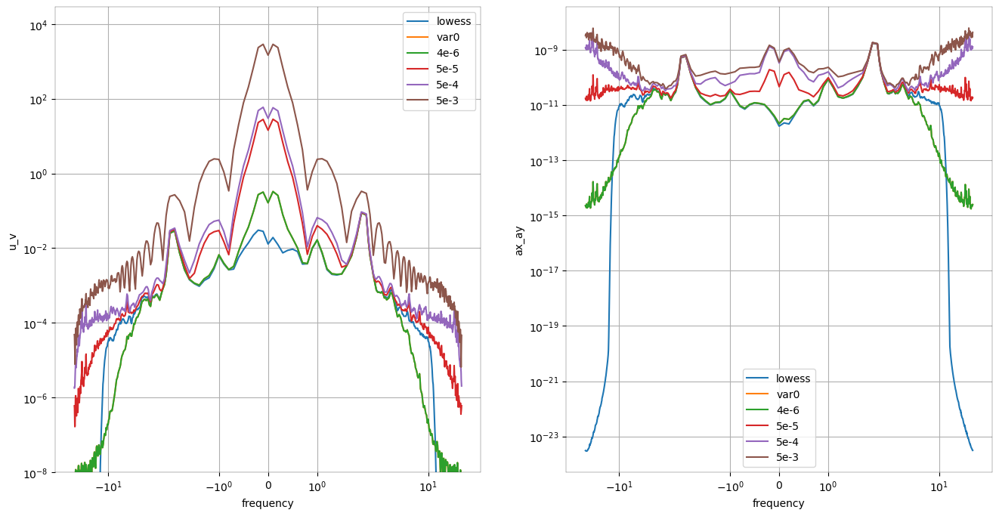

In [10]:
dss2s = spectrum_var(ds2s)
dss2v = spectrum_var(ds2v)
dss2 = spectrum_var(ds2)
dss3 = spectrum_var(ds3)
dss4 = spectrum_var(ds4)
dss5 = spectrum_var(ds5)

fig, axs = plt.subplots(1,2, figsize=(16,8))
ax=axs[0]
dss2s.mean('id').u_v.plot(ax=ax, label='lowess')
dss2v.mean('id').u_v.plot(ax=ax, label='var0')
dss2.mean('id').u_v.plot(ax=ax, label='4e-6')
dss3.mean('id').u_v.plot(ax=ax, label='5e-5')
dss4.mean('id').u_v.plot(ax=ax, label='5e-4')
dss5.mean('id').u_v.plot(ax=ax, label='5e-3')

ax.set_xscale("symlog")#, linthresh=linthresh, linscale=linscale)
ax.set_yscale("log")
ax.grid()
ax.legend()
ax.set_ylim(1e-8)

ax=axs[1]
dss2s.mean('id').ax_ay.plot(ax=ax, label='lowess')
dss2v.mean('id').ax_ay.plot(ax=ax, label='var0')
dss2.mean('id').ax_ay.plot(ax=ax, label='4e-6')
dss3.mean('id').ax_ay.plot(ax=ax, label='5e-5')
dss4.mean('id').ax_ay.plot(ax=ax, label='5e-4')
dss5.mean('id').ax_ay.plot(ax=ax, label='5e-3')

ax.set_xscale("symlog")#, linthresh=linthresh, linscale=linscale)
ax.set_yscale("log")
ax.grid()
ax.legend()

## Pour dti =10min, change accelartion_amplitude
- take 5.1e-6

In [ ]:
path_L1 = '/Users/mdemol/DATA_DRIFTERS/drifters/raw/L1_carthe_uwa_20231006_094155_5min.csv'
df_L1 =pd.read_csv(path_L1, parse_dates=["time"], dtype={"id": str})

param_var = dict(
    acc_cut=1,
    position_error=60,
    acceleration_amplitude=5e-6,
    acceleration_T=0.05 * 86400,
    time_chunk=2,
    acc_cut_key=("acceleration_east", "acceleration_north", "acceleration"),
)
    
ds2 = apply_optimize_smoothing(path_L1, t_target='10min', method='variational', version=version, param=param_var)
param_var['acceleration_amplitude']=5e-6
ds3 = apply_optimize_smoothing(path_L1, t_target='10min', method='variational', version=version, param=param_var)
param_var['acceleration_amplitude']=5.5e-6
ds4 = apply_optimize_smoothing(path_L1, t_target='10min', method='variational', version=version, param=param_var)
param_var['acceleration_amplitude']=5.2e-6
ds5 = apply_optimize_smoothing(path_L1, t_target='10min', method='variational', version=version, param=param_var)
param_var['acceleration_amplitude']=5.3e-6
ds6 = apply_optimize_smoothing(path_L1, t_target='10min', method='variational', version=version, param=param_var)
param_var['acceleration_amplitude']=5.4e-6
ds7 = apply_optimize_smoothing(path_L1, t_target='10min', method='variational', version=version, param=param_var)

In [ ]:
dss2s = spectrum_var(ds2s)
dss2v = spectrum_var(ds2v)
dss2 = spectrum_var(ds2)
dss3 = spectrum_var(ds3)
dss4 = spectrum_var(ds4)
dss5 = spectrum_var(ds5)
dss6 = spectrum_var(ds6)
dss7 = spectrum_var(ds7)

fig, axs = plt.subplots(1,2, figsize=(16,8))
ax=axs[0]
dss2s.mean('id').u_v.plot(ax=ax, label='lowess')
dss2v.mean('id').u_v.plot(ax=ax, label='var0')
dss2.mean('id').u_v.plot(ax=ax, label='4e-6')
dss3.mean('id').u_v.plot(ax=ax, label='5e-6')
dss4.mean('id').u_v.plot(ax=ax, label='5.5e-6')
dss5.mean('id').u_v.plot(ax=ax, label='5.2e-6')
dss6.mean('id').u_v.plot(ax=ax, label='5.3e-6')
dss7.mean('id').u_v.plot(ax=ax, label='5.4e-6')
ax.set_xscale("symlog")#, linthresh=linthresh, linscale=linscale)
ax.set_yscale("log")
ax.grid()
ax.legend()
ax.set_ylim(1e-8)

ax=axs[1]
dss2s.mean('id').ax_ay.plot(ax=ax, label='lowess 30min')
dss2v.mean('id').ax_ay.plot(ax=ax, label='var 30min')
dss2.mean('id').ax_ay.plot(ax=ax, label='4e-6')
dss3.mean('id').ax_ay.plot(ax=ax, label='5e-6')
dss4.mean('id').ax_ay.plot(ax=ax, label='5.5e-6')
dss5.mean('id').ax_ay.plot(ax=ax, label='5.5e-6')
dss6.mean('id').ax_ay.plot(ax=ax, label='4.9e-6')
dss7.mean('id').ax_ay.plot(ax=ax, label='4.5e-6')
ax.set_xscale("symlog")#, linthresh=linthresh, linscale=linscale)
ax.set_yscale("log")
ax.grid()
ax.legend()
ax.set_ylim(1e-15)

## Pour dti =30min, change accelaration_T
- take 

In [11]:
path_L1 = '/Users/mdemol/DATA_DRIFTERS/drifters/raw/L1_carthe_uwa_20231006_094155_5min.csv'
df_L1 =pd.read_csv(path_L1, parse_dates=["time"], dtype={"id": str})

param_var = dict(
    acc_cut=1,
    position_error=60,
    acceleration_amplitude=5e-6,
    acceleration_T=0.05 * 86400,
    time_chunk=2,
    acc_cut_key=("acceleration_east", "acceleration_north", "acceleration"),
)
    
ds2 = apply_optimize_smoothing(path_L1, t_target='30min', method='variational', version=version, param=param_var)
param_var['acceleration_T']=0.06*86400
ds3 = apply_optimize_smoothing(path_L1, t_target='30min', method='variational', version=version, param=param_var)
param_var['acceleration_T']=0.04*86400
ds4 = apply_optimize_smoothing(path_L1, t_target='30min', method='variational', version=version, param=param_var)
param_var['acceleration_T']=0.1*86400
ds5 = apply_optimize_smoothing(path_L1, t_target='30min', method='variational', version=version, param=param_var)
param_var['acceleration_T']=0.01*86400
ds6 = apply_optimize_smoothing(path_L1, t_target='30min', method='variational', version=version, param=param_var)

Divided into 1 segments
Chunking dataframe into 2 days chunks
Divided into 3 segments
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Divided into 2 segments
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Divided into 1 segments
Chunking dataframe into 2 days chunks
Divided into 3 segments
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Divided into 1 segments
Chunking dataframe into 2 days chunks
Divided into 1 segments
Chunking dataframe into 2 days chunks
Divided into 12 segments
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Divided into 1 segments
Chunking dataframe into 2 days chunks
Divided into 1 segments
Chunking dataframe into 2 days chunks
Divided into 1 segments
Chunking dataframe into 2 days chunks
Divided into 3 segments
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Divided into 2 segments
Chunking dataframe into 2 days chunks
Chu

In [12]:
param_var['acceleration_T']=1*86400
ds7 = apply_optimize_smoothing(path_L1, t_target='30min', method='variational', version=version, param=param_var)

Divided into 1 segments
Chunking dataframe into 2 days chunks
Divided into 3 segments
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Divided into 2 segments
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Divided into 1 segments
Chunking dataframe into 2 days chunks
Divided into 3 segments
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Divided into 1 segments
Chunking dataframe into 2 days chunks
Divided into 1 segments
Chunking dataframe into 2 days chunks
Divided into 12 segments
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Divided into 1 segments
Chunking dataframe into 2 days chunks
Divided into 1 segments
Chunking dataframe into 2 days chunks


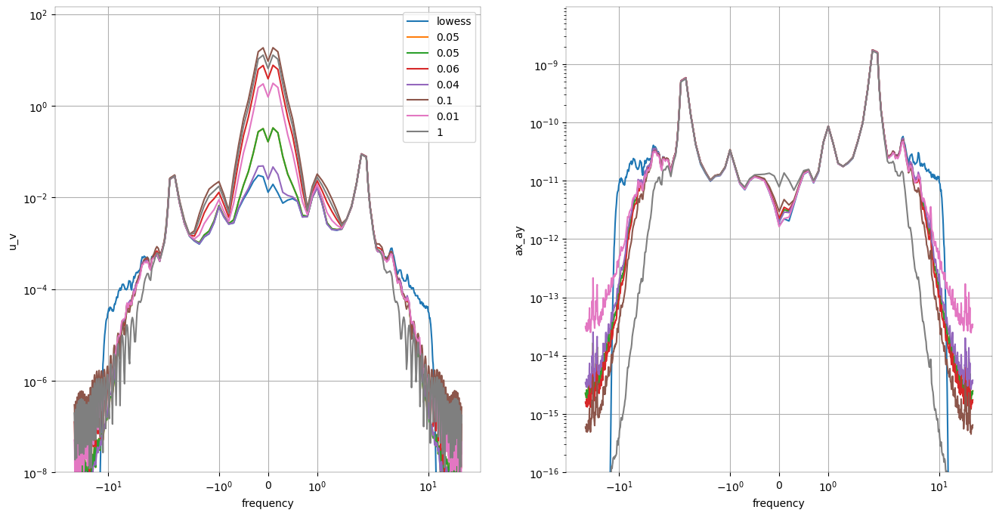

In [13]:
dss2s = spectrum_var(ds2s)
dss2v = spectrum_var(ds2v)
dss2 = spectrum_var(ds2)
dss3 = spectrum_var(ds3)
dss4 = spectrum_var(ds4)
dss5 = spectrum_var(ds5)
dss6 = spectrum_var(ds6)
dss7 = spectrum_var(ds7)

fig, axs = plt.subplots(1,2, figsize=(16,8))
ax=axs[0]
dss2s.mean('id').u_v.plot(ax=ax, label='lowess')
dss2v.mean('id').u_v.plot(ax=ax, label='0.05')
dss2.mean('id').u_v.plot(ax=ax, label='0.05')
dss3.mean('id').u_v.plot(ax=ax, label='0.06')
dss4.mean('id').u_v.plot(ax=ax, label='0.04')
dss5.mean('id').u_v.plot(ax=ax, label='0.1')
dss6.mean('id').u_v.plot(ax=ax, label='0.01')
dss7.mean('id').u_v.plot(ax=ax, label='1')

ax.set_xscale("symlog")#, linthresh=linthresh, linscale=linscale)
ax.set_yscale("log")
ax.grid()
ax.legend()
ax.set_ylim(1e-8)

ax=axs[1]
dss2s.mean('id').ax_ay.plot(ax=ax, label='lowess')
dss2v.mean('id').ax_ay.plot(ax=ax, label='var0')
dss2.mean('id').ax_ay.plot(ax=ax)
dss3.mean('id').ax_ay.plot(ax=ax)
dss4.mean('id').ax_ay.plot(ax=ax)
dss5.mean('id').ax_ay.plot(ax=ax)
dss6.mean('id').ax_ay.plot(ax=ax)
dss7.mean('id').ax_ay.plot(ax=ax, label='1')
ax.set_xscale("symlog")#, linthresh=linthresh, linscale=linscale)
ax.set_yscale("log")
ax.set_ylim(1e-16)
ax.grid()

## Pour dti =30min, timechunk
- take 

In [14]:
path_L1 = '/Users/mdemol/DATA_DRIFTERS/drifters/raw/L1_carthe_uwa_20231006_094155_5min.csv'
df_L1 =pd.read_csv(path_L1, parse_dates=["time"], dtype={"id": str})

param_var = dict(
    acc_cut=1,
    position_error=60,
    acceleration_amplitude=5e-6,
    acceleration_T=0.05 * 86400,
    time_chunk=2,
    acc_cut_key=("acceleration_east", "acceleration_north", "acceleration"),
)
    
ds2 = apply_optimize_smoothing(path_L1, t_target='30min', method='variational', version=version, param=param_var)
ds3 = apply_optimize_smoothing(path_L1, t_target='30min', method='variational', version=version, param=param_var)
param_var['time_chunk']=3
ds4 = apply_optimize_smoothing(path_L1, t_target='30min', method='variational', version=version, param=param_var)
param_var['time_chunk']=10
ds5 = apply_optimize_smoothing(path_L1, t_target='30min', method='variational', version=version, param=param_var)
param_var['time_chunk']=0.5
ds6 = apply_optimize_smoothing(path_L1, t_target='30min', method='variational', version=version, param=param_var)

Divided into 1 segments
Chunking dataframe into 2 days chunks
Divided into 3 segments
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Divided into 2 segments
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Divided into 1 segments
Chunking dataframe into 2 days chunks
Divided into 3 segments
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Divided into 1 segments
Chunking dataframe into 2 days chunks
Divided into 1 segments
Chunking dataframe into 2 days chunks
Divided into 12 segments
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Divided into 1 segments
Chunking dataframe into 2 days chunks
Divided into 1 segments
Chunking dataframe into 2 days chunks
Divided into 1 segments
Chunking dataframe into 2 days chunks
Divided into 3 segments
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Divided into 2 segments
Chunking dataframe into 2 days chunks
Chu

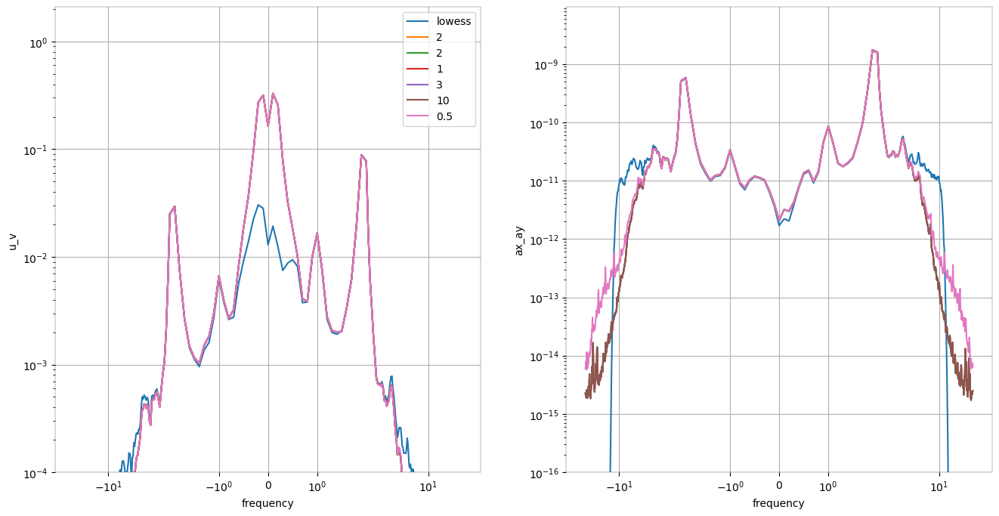

In [15]:
dss2s = spectrum_var(ds2s)
dss2v = spectrum_var(ds2v)
dss2 = spectrum_var(ds2)
dss3 = spectrum_var(ds3)
dss4 = spectrum_var(ds4)
dss5 = spectrum_var(ds5)
dss6 = spectrum_var(ds6)
#dss7 = spectrum_var(ds7)

fig, axs = plt.subplots(1,2, figsize=(16,8))
ax=axs[0]
dss2s.mean('id').u_v.plot(ax=ax, label='lowess')
dss2v.mean('id').u_v.plot(ax=ax, label='2')
dss2.mean('id').u_v.plot(ax=ax, label='2')
dss3.mean('id').u_v.plot(ax=ax, label='1')
dss4.mean('id').u_v.plot(ax=ax, label='3')
dss5.mean('id').u_v.plot(ax=ax, label='10')
dss6.mean('id').u_v.plot(ax=ax, label='0.5')
#dss7.mean('id').u_v.plot(ax=ax, label='1')

ax.set_xscale("symlog")#, linthresh=linthresh, linscale=linscale)
ax.set_yscale("log")
ax.grid()
ax.legend()
ax.set_ylim(1e-4)

ax=axs[1]
dss2s.mean('id').ax_ay.plot(ax=ax, label='lowess')
dss2v.mean('id').ax_ay.plot(ax=ax, label='var0')
dss2.mean('id').ax_ay.plot(ax=ax)
dss3.mean('id').ax_ay.plot(ax=ax)
dss4.mean('id').ax_ay.plot(ax=ax)
dss5.mean('id').ax_ay.plot(ax=ax)
dss6.mean('id').ax_ay.plot(ax=ax)
#dss7.mean('id').ax_ay.plot(ax=ax, label='1')
ax.set_xscale("symlog")#, linthresh=linthresh, linscale=linscale)
ax.set_yscale("log")
ax.set_ylim(1e-16)
ax.grid()

## Pour dti =30min, timechunk
- take 

In [16]:
path_L1 = '/Users/mdemol/DATA_DRIFTERS/drifters/raw/L1_carthe_uwa_20231006_094155_5min.csv'
df_L1 =pd.read_csv(path_L1, parse_dates=["time"], dtype={"id": str})

param_var = dict(
    acc_cut=1,
    position_error=60,
    acceleration_amplitude=5e-6,
    acceleration_T=0.05 * 86400,
    time_chunk=2,
    acc_cut_key=("acceleration_east", "acceleration_north", "acceleration"),
)
    
ds2 = apply_optimize_smoothing(path_L1, t_target='30min', method='variational', version=version, param=param_var)
param_var['position_error']=35
ds3 = apply_optimize_smoothing(path_L1, t_target='30min', method='variational', version=version, param=param_var)
param_var['position_error']=45
ds4 = apply_optimize_smoothing(path_L1, t_target='30min', method='variational', version=version, param=param_var)
param_var['position_error']=55
ds5 = apply_optimize_smoothing(path_L1, t_target='30min', method='variational', version=version, param=param_var)
param_var['position_error']=75
ds6 = apply_optimize_smoothing(path_L1, t_target='30min', method='variational', version=version, param=param_var)

Divided into 1 segments
Chunking dataframe into 2 days chunks
Divided into 3 segments
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Divided into 2 segments
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Divided into 1 segments
Chunking dataframe into 2 days chunks
Divided into 3 segments
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Divided into 1 segments
Chunking dataframe into 2 days chunks
Divided into 1 segments
Chunking dataframe into 2 days chunks
Divided into 12 segments
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Divided into 1 segments
Chunking dataframe into 2 days chunks
Divided into 1 segments
Chunking dataframe into 2 days chunks
Divided into 1 segments
Chunking dataframe into 2 days chunks
Divided into 3 segments
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Divided into 2 segments
Chunking dataframe into 2 days chunks
Chu

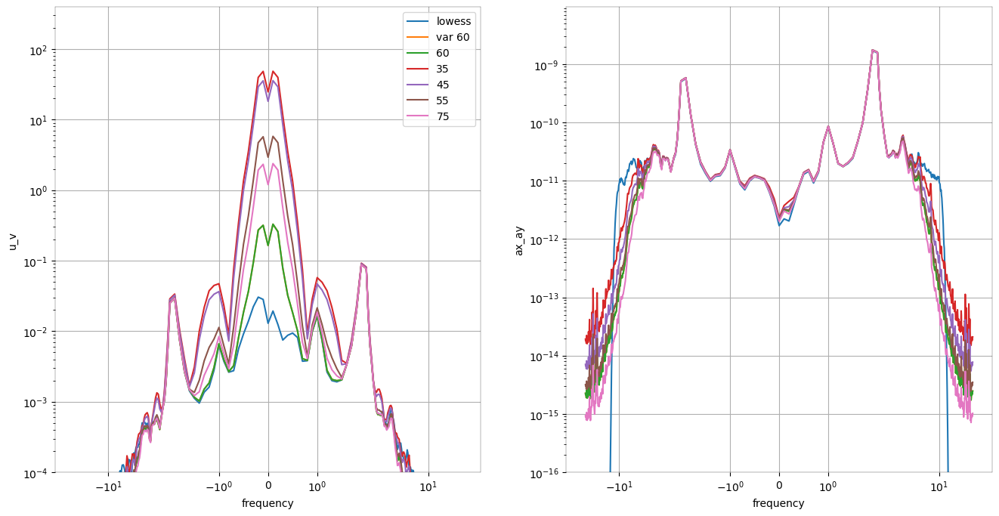

In [17]:
dss2s = spectrum_var(ds2s)
dss2v = spectrum_var(ds2v)
dss2 = spectrum_var(ds2)
dss3 = spectrum_var(ds3)
dss4 = spectrum_var(ds4)
dss5 = spectrum_var(ds5)
dss6 = spectrum_var(ds6)
#dss7 = spectrum_var(ds7)

fig, axs = plt.subplots(1,2, figsize=(16,8))
ax=axs[0]
dss2s.mean('id').u_v.plot(ax=ax, label='lowess')
dss2v.mean('id').u_v.plot(ax=ax, label='var 60')
dss2.mean('id').u_v.plot(ax=ax, label='60')
dss3.mean('id').u_v.plot(ax=ax, label='35')
dss4.mean('id').u_v.plot(ax=ax, label='45')
dss5.mean('id').u_v.plot(ax=ax, label='55')
dss6.mean('id').u_v.plot(ax=ax, label='75')
#dss7.mean('id').u_v.plot(ax=ax, label='1')

ax.set_xscale("symlog")#, linthresh=linthresh, linscale=linscale)
ax.set_yscale("log")
ax.grid()
ax.legend()
ax.set_ylim(1e-4)

ax=axs[1]
dss2s.mean('id').ax_ay.plot(ax=ax, label='lowess')
dss2v.mean('id').ax_ay.plot(ax=ax, label='var0')
dss2.mean('id').ax_ay.plot(ax=ax)
dss3.mean('id').ax_ay.plot(ax=ax)
dss4.mean('id').ax_ay.plot(ax=ax)
dss5.mean('id').ax_ay.plot(ax=ax)
dss6.mean('id').ax_ay.plot(ax=ax)
#dss7.mean('id').ax_ay.plot(ax=ax, label='1')
ax.set_xscale("symlog")#, linthresh=linthresh, linscale=linscale)
ax.set_yscale("log")
ax.set_ylim(1e-16)
ax.grid()

## Pour dti =30min, maxgap
- take 

In [18]:
path_L1 = '/Users/mdemol/DATA_DRIFTERS/drifters/raw/L1_carthe_uwa_20231006_094155_5min.csv'
df_L1 =pd.read_csv(path_L1, parse_dates=["time"], dtype={"id": str})

param_var = dict(
    acc_cut=1,
    position_error=60,
    acceleration_amplitude=5e-6,
    acceleration_T=0.05 * 86400,
    time_chunk=2,
    acc_cut_key=("acceleration_east", "acceleration_north", "acceleration"),
)
    
ds2 = apply_optimize_smoothing(path_L1, t_target='30min', method='variational', version=version, param=param_var, maxgap=3*3600)

ds3 = apply_optimize_smoothing(path_L1, t_target='30min', method='variational', version=version, param=param_var, maxgap=4*3600)

ds4 = apply_optimize_smoothing(path_L1, t_target='30min', method='variational', version=version, param=param_var, maxgap=5*3600)

ds5 = apply_optimize_smoothing(path_L1, t_target='30min', method='variational', version=version, param=param_var, maxgap=6*3600)

ds6 = apply_optimize_smoothing(path_L1, t_target='30min', method='variational', version=version, param=param_var, maxgap=10*3600)

Divided into 1 segments
Chunking dataframe into 2 days chunks
Divided into 3 segments
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Divided into 2 segments
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Divided into 1 segments
Chunking dataframe into 2 days chunks
Divided into 3 segments
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Divided into 1 segments
Chunking dataframe into 2 days chunks
Divided into 1 segments
Chunking dataframe into 2 days chunks
Divided into 12 segments
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Divided into 1 segments
Chunking dataframe into 2 days chunks
Divided into 1 segments
Chunking dataframe into 2 days chunks
Divided into 1 segments
Chunking dataframe into 2 days chunks
Divided into 1 segments
Chunking dataframe into 2 days chunks
Divided into 1 segments
Chunking dataframe into 2 days chunks
Divided into 1 segments
Chunking datafram

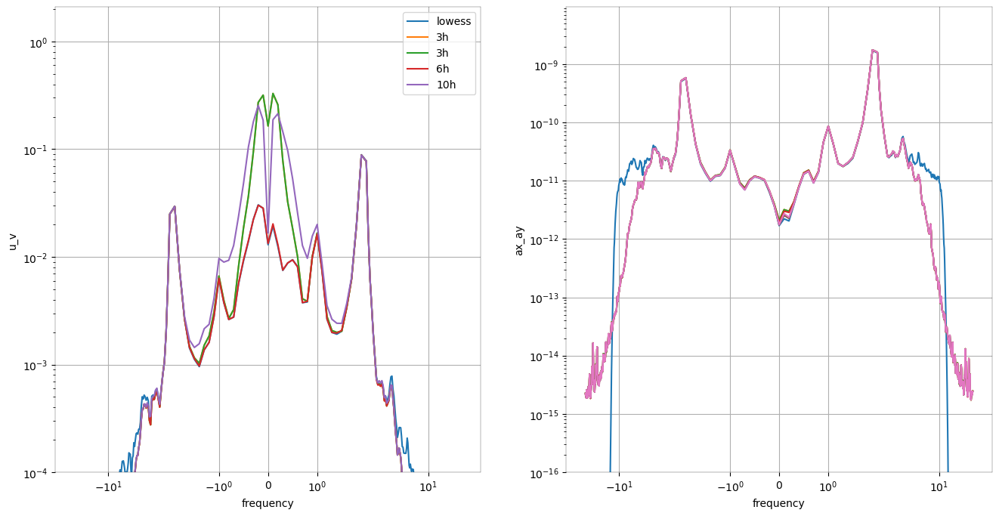

In [23]:
dss2s = spectrum_var(ds2s)
dss2v = spectrum_var(ds2v)
dss2 = spectrum_var(ds2)
dss3 = spectrum_var(ds3)
dss4 = spectrum_var(ds4)
dss5 = spectrum_var(ds5)
dss6 = spectrum_var(ds6)
#dss7 = spectrum_var(ds7)

fig, axs = plt.subplots(1,2, figsize=(16,8))
ax=axs[0]
dss2s.mean('id').u_v.plot(ax=ax, label='lowess')
dss2v.mean('id').u_v.plot(ax=ax, label='3h')
dss2.mean('id').u_v.plot(ax=ax, label='3h')
#dss3.mean('id').u_v.plot(ax=ax, label='4h')
#dss4.mean('id').u_v.plot(ax=ax, label='5h')
dss5.mean('id').u_v.plot(ax=ax, label='6h')
dss6.mean('id').u_v.plot(ax=ax, label='10h')
#dss7.mean('id').u_v.plot(ax=ax, label='1')

ax.set_xscale("symlog")#, linthresh=linthresh, linscale=linscale)
ax.set_yscale("log")
ax.grid()
ax.legend()
ax.set_ylim(1e-4)

ax=axs[1]
dss2s.mean('id').ax_ay.plot(ax=ax, label='lowess')
dss2v.mean('id').ax_ay.plot(ax=ax, label='var0')
dss2.mean('id').ax_ay.plot(ax=ax)
dss3.mean('id').ax_ay.plot(ax=ax)
dss4.mean('id').ax_ay.plot(ax=ax)
dss5.mean('id').ax_ay.plot(ax=ax)
dss6.mean('id').ax_ay.plot(ax=ax)
#dss7.mean('id').ax_ay.plot(ax=ax, label='1')
ax.set_xscale("symlog")#, linthresh=linthresh, linscale=linscale)
ax.set_yscale("log")
ax.set_ylim(1e-16)
ax.grid()